In [1]:
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

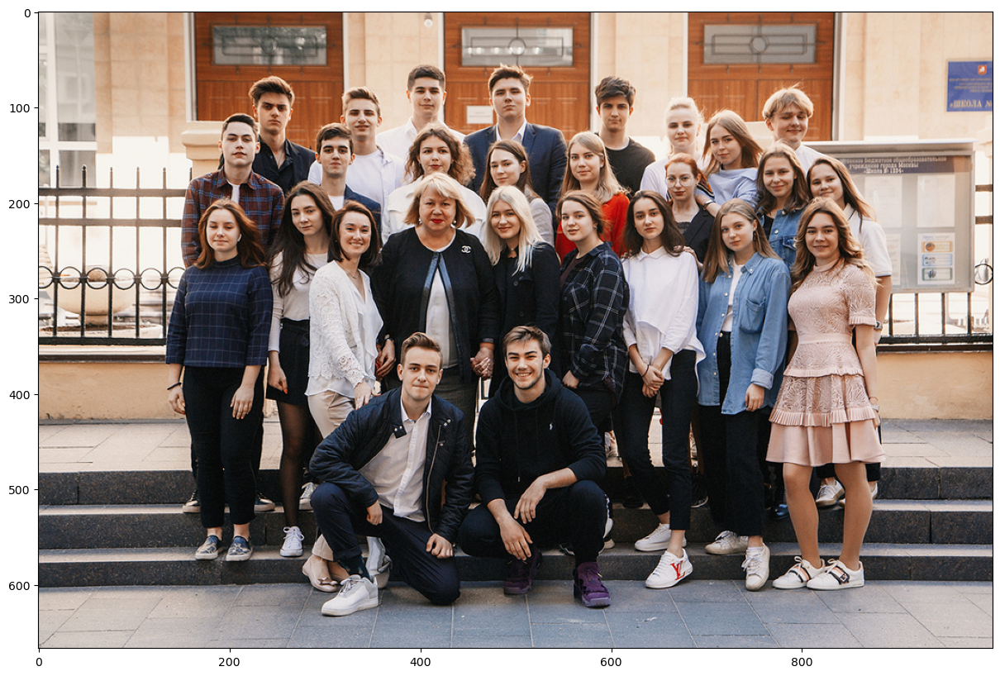

In [3]:
# Let's read the image
img = cv2.imread('data/classPhoto.jpg')
# Convert image BGR to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Convert image to gray scale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
#plot image
plt.imshow(img)

Number of detected faces: 27


(<matplotlib.image.AxesImage at 0x7fc25af76190>,
 Text(0.5, 1.0, 'dlib predictor 81'))

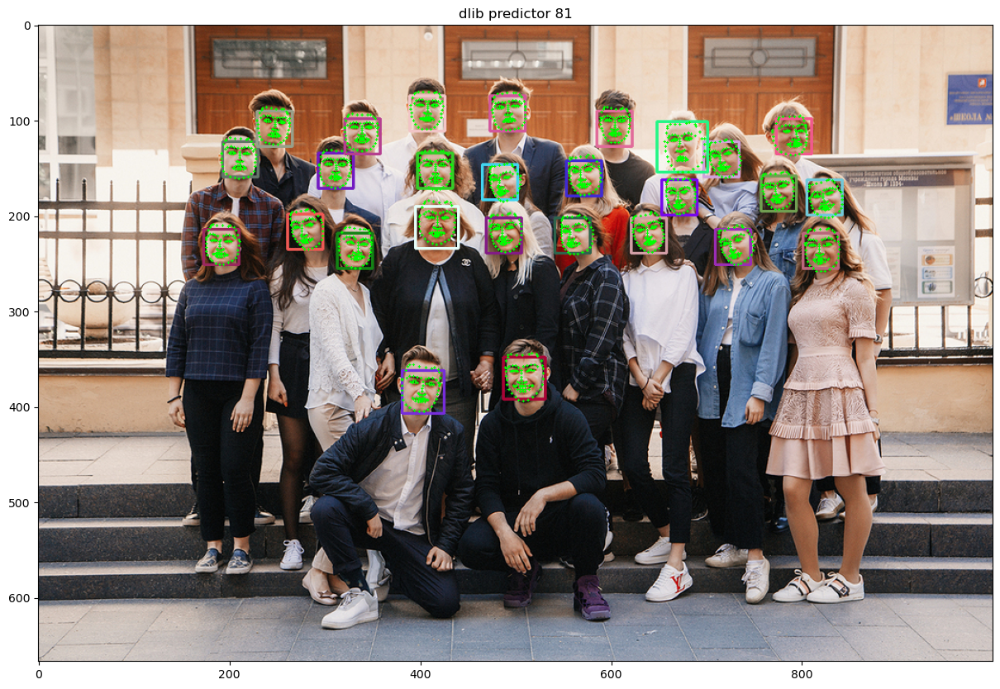

In [4]:
import dlib
import random
result_dlib = np.copy(img)

# Let's load the detector
detector = dlib.get_frontal_face_detector()

# Let's load the predictor
predictor = dlib.shape_predictor('shape_predictor_81_face_landmarks.dat')

# Detect faces, see http://dlib.net/face_detector.py.html
# 1 --> upsampling factor
rects = detector(gray, 1)

print('Number of detected faces:', len(rects))
random.seed(55)

# Draw rectangle function
def draw_rect(image, rect, color):
    x, y, w, h = rect.left(), rect.top(), rect.width(), rect.height()
    cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)

# Drow points function
def draw_landmarks(image, landmarks):
    for i, point in enumerate(landmarks.parts()):
        if i % 1 == 0: 
            cv2.circle(image, (point.x, point.y), 1, (0, 255, 0), -1)

for rect in rects:
    # Landmarks detection in detected face area
    landmarks = predictor(gray, rect)
    
    # Assign random color
    color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    
    # Let's call draw_rect function
    draw_rect(result_dlib, rect, color)
    
    # Let's call draw_landmarks function
    draw_landmarks(result_dlib, landmarks)

# Plot result image
plt.imshow(result_dlib), plt.title('dlib predictor 81')

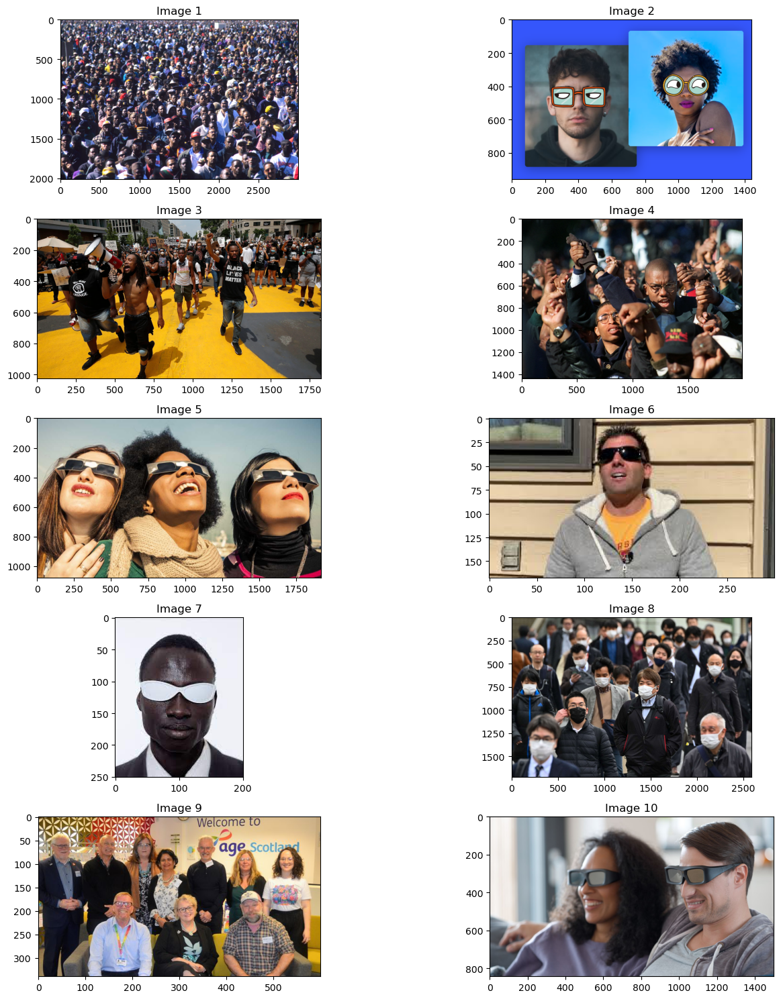

In [5]:
image_paths = [
    'data/million-man-march-1995.jpg',
    'data/add-funny-glasses-to-people.png',
    'data/America_Protests_Juneteenth_20170571362516.webp',
    'data/d6d5f4a0-5180-4c0b-acac-5cf8a3a9ca62-AP_95101601283.webp',
    'data/eclipse-glasses.png',
    'data/images (1).jpeg',
    'data/images.jpeg',
    'data/masks-tokyo-gty-ps-230314_1678802239571_hpMain.jpg',
    'data/scottish-older-peoples.jpg',
    'data/young-couple-watching-tv-in-3d.jpg'
]
plt.figure(figsize=(15, 15))

# Loop for loading and plot every picture with different path   
for i, image_path in enumerate(image_paths, start=1):
    # Read image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Преобразование из BGR в RGB
    
    plt.subplot(5, 2, i)
    plt.imshow(img)
    plt.title(f'Image {i}')

# Layout show images
plt.tight_layout()
plt.show()

Number of detected faces on data/million-man-march-1995.jpg: 2


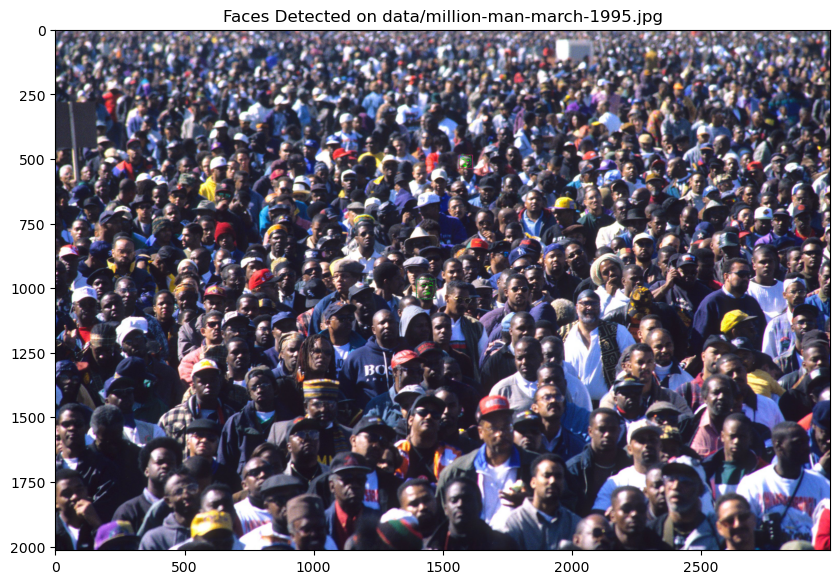

Number of detected faces on data/add-funny-glasses-to-people.png: 1


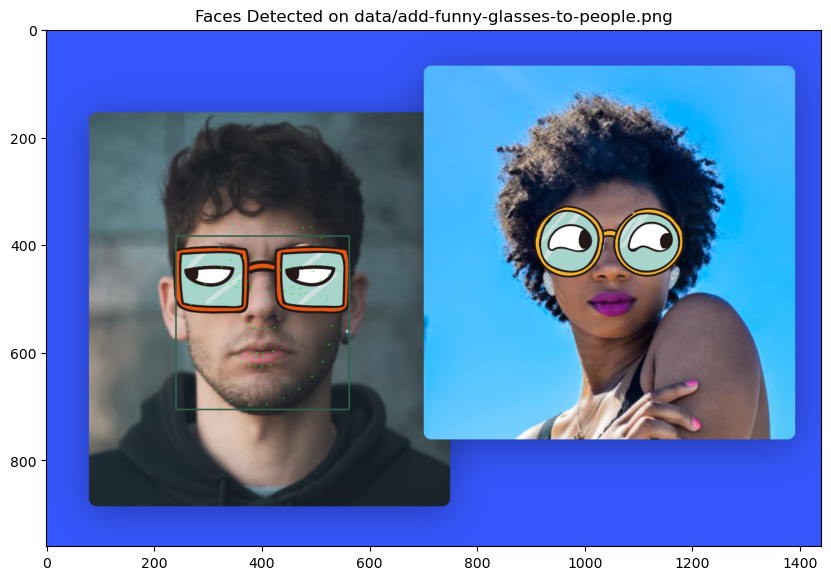

Number of detected faces on data/America_Protests_Juneteenth_20170571362516.webp: 5


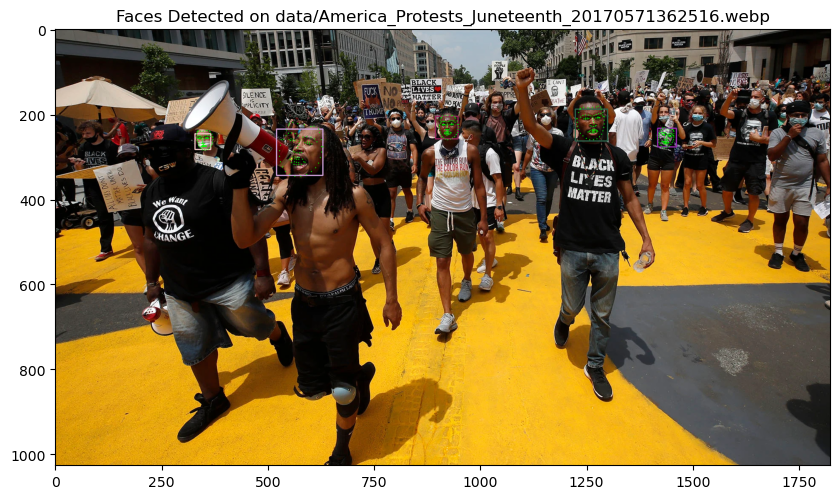

Number of detected faces on data/d6d5f4a0-5180-4c0b-acac-5cf8a3a9ca62-AP_95101601283.webp: 2


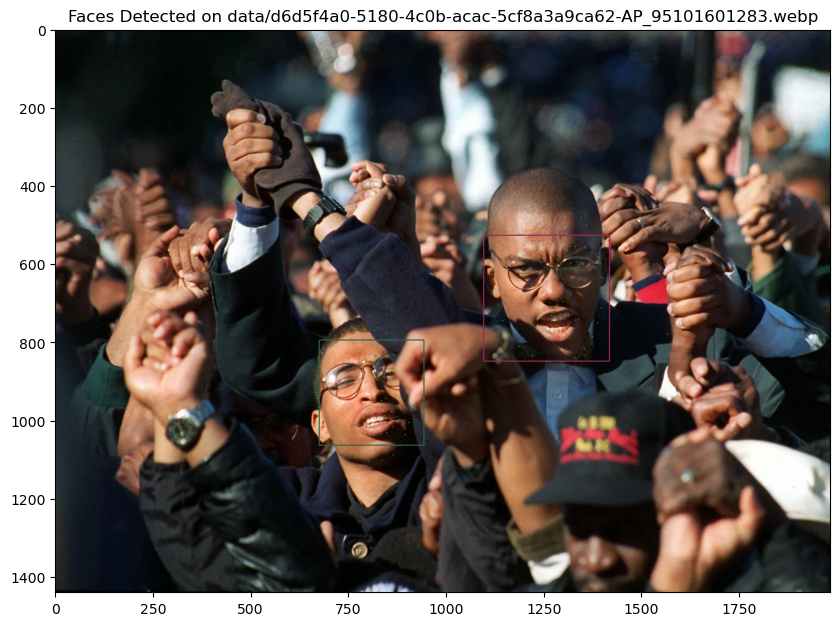

Number of detected faces on data/eclipse-glasses.png: 0


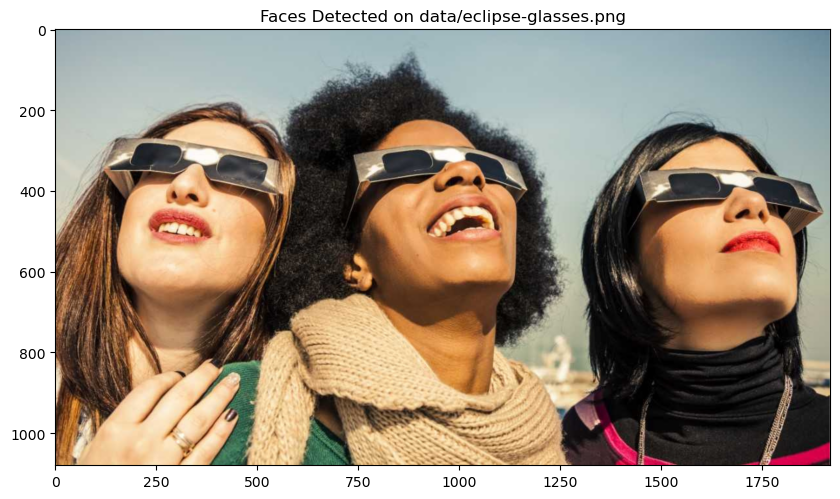

Number of detected faces on data/images (1).jpeg: 1


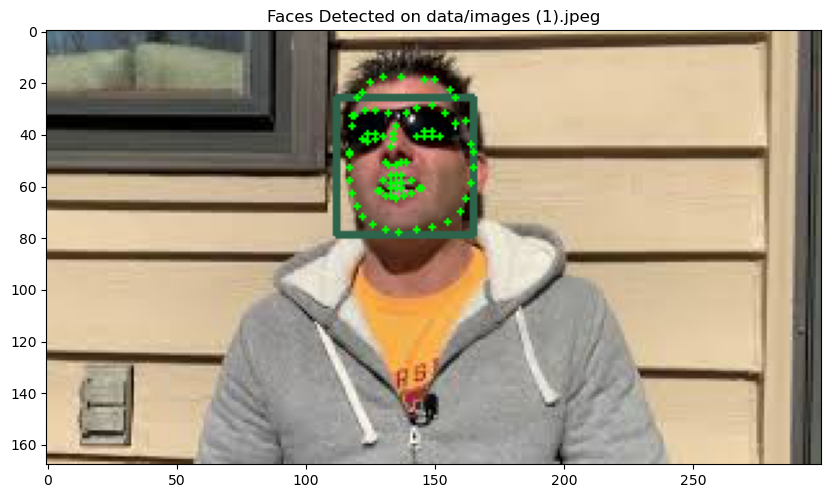

Number of detected faces on data/images.jpeg: 0


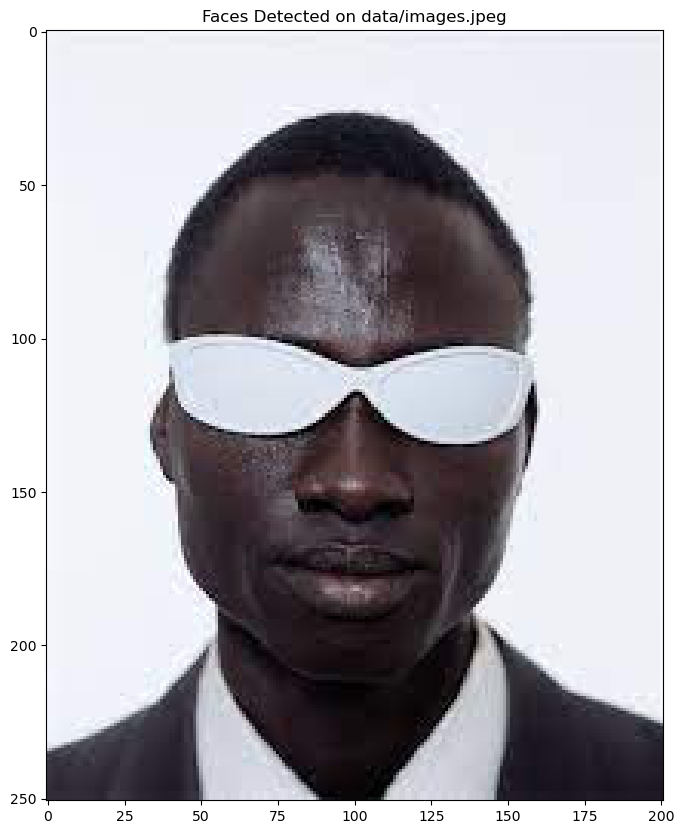

Number of detected faces on data/masks-tokyo-gty-ps-230314_1678802239571_hpMain.jpg: 6


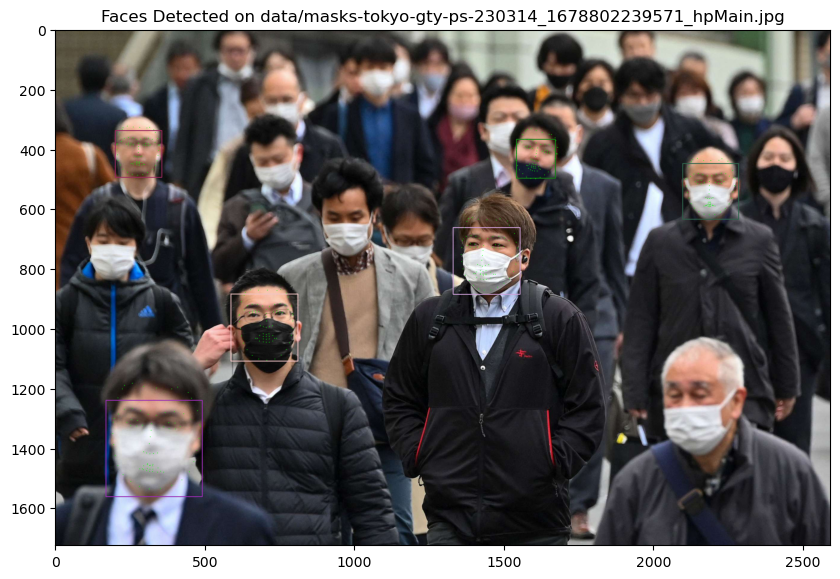

Number of detected faces on data/scottish-older-peoples.jpg: 8


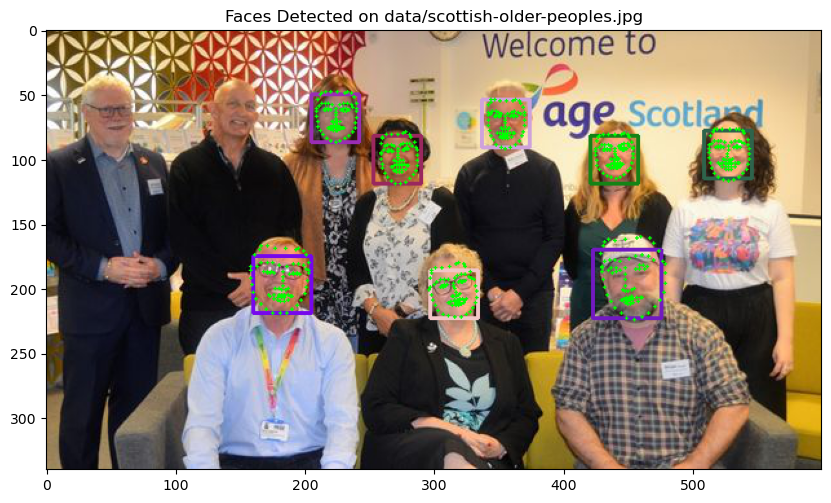

Number of detected faces on data/young-couple-watching-tv-in-3d.jpg: 0


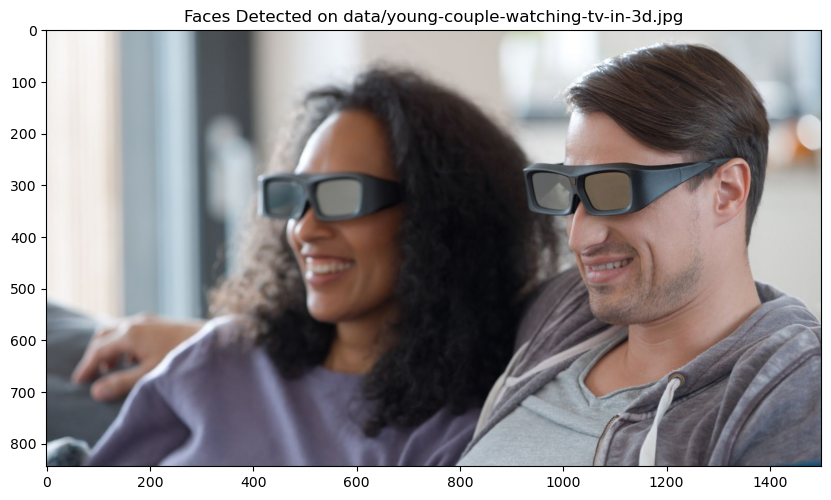

In [6]:
for img_path in image_paths:
    # Read image in BGR
    img = cv2.imread(img_path)
    
    # Convert to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Convert in gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Make copy
    result_dlib = np.copy(img)

    # Detect faces
    rects = detector(gray, 1)

    print(f'Number of detected faces on {img_path}:', len(rects))

    # Assign seed
    random.seed(55)

    for rect in rects:
        # Landmarks detection in detected face area
        landmarks = predictor(gray, rect)
        
        # Assign random color
        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        
        # Call draw_rect function
        draw_rect(result_dlib, rect, color)
        
        # Call draw_landmarks function
        draw_landmarks(result_dlib, landmarks)

    # plot images with detected faces and landmarks
    plt.figure(figsize=(10, 10))
    plt.imshow(result_dlib)
    plt.title(f'Faces Detected on {img_path}')
    plt.show()